# Capstone Project - The Battle of Neighborhoods  - Week 2
### Applied Data Science Capstone by IBM/Coursera



## Table of Contents

1.  <a href="#item1">Business Understanding</a>
2.  <a href="#item2">Data Understanding</a>  
3.  <a href="#item3">Data Preparation & Cleaning</a>  
4.  <a href="#item4">Modeling</a>  
5.  <a href="#item5">Evaluation</a>
6.  <a href="#item5">Deployment</a>   
7.  <a href="#item5">Conclusions</a>   


## 1. Business Understanding

New York City is one of the most famous in the world and with the biggest population in the United States of America. It has a population nearly in 2020 of approximately 8,622,357 million residents. The population density is 27,755.25 people per square mile, with an area of 468.19 square miles. With this density population, it provides many business opportunities, attracting in many different players into the market.
With this basic information, we can gain insights derived from analysis that will give a good understanding of the business environment, which can help in strategically targeting the market.
	A restaurant is a business, which prepares and serves food and drink in a famous and excellent cuisine. Food culture include an array of international cuisines influenced by the city’s immigrant history. With this information, we will analysis public data to find insight, to start a new way to start open a restaurant.  


### Project Objectives 

Population density is a key aspect of analyzing data on cities, and it plays an important part in issues such as transport, infrastructure and living standards for residents. Some people prefer smaller, less crowded cities with open spaces, while others would rather have the hustle and bustle of big city life.
In New York, not just Pizzerias or Coffee Shops are famous, but also there is fine Michelin starred restaurants with the most diverse type of food. With this diversity of restaurants with different categories like Chinese, Indian, French, Brazilian, etc. So here, the main problem is to find the following answer for the question below:
  
- List and visualize all major parts of New York City that has great restaurants. 
- What is the best location in New York City for Brazilian? 
- Which areas have potential Restaurant Market? 
- Which all areas lack Brazilian Restaurants? 
- Which is the best place to stay if you prefer Brazilian Food?


## 2. Data Understanding

New York City's have a collection of restaurants from across the city that defined by a diverse culture with a lot of diverse type of food, each belonging to different categories like Chinese, Indian, French, Brazilian, etc. For this project, we will use an open data as following below: 
New York City data that contains list Boroughs, Neighborhoods along with their latitude and longitude. 

-	Data set : https://cocl.us/new_york_dataset 
-	Description: This data set contains the required information. Moreover, we will use this data set to explore various neighborhoods of New York City.

Chinese, Indian, French, Brazilian restaurants in each neighborhood of New York City. 

-	Data set : Foursquare API 
-	Description: By using this API, we will get all the venues in each neighborhood. We can filter these venues to get Chinese, Indian, French, Brazilian restaurants.

GeoSpace data set
-	Data set : https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm 
-	Description: By using this geo, space data we will get the New York Borough boundaries that will help us visualize choropleth map. 


| Borough | Neighborhood | Latitude  | Longitude |
| ------------- | ------------- | ----- | ----- |
| Bronx   | Wakefield    | 40.894705 | -73.847201 |
| Bronx   | Co-op City   | 40.874294 | -73.829939 |
| Bronx   | Eastchester  | 40.887556 | -73.827806 |
| Bronx   | Fieldston    | 40.895437 | -73.905643 |
| Bronx   | Riverdale    | 40.890834 | -73.912585 |

## 3. Data Preparation & Cleaning

### Import necessary Libraries

In [1]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation

!pip install geopy
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize


# ! pip install folium==2.11.2
! pip install folium
import folium # plotting library

# associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline

print('Folium installed')
print('Libraries imported.')

Folium installed
Libraries imported.


### Define Foursquare Credentials and Version

We define a function to intract with FourSquare API and get top 100 venues within a radius of 1000 metres for a given latitude and longitude. Below function will return us the venue id , venue name and category.

In [2]:
CLIENT_ID = 'H0QYOVPLGSN3PRC255YJN1RTOCY103J4EQOIX1ZRJB1RIEJN' # your Foursquare ID
CLIENT_SECRET = 'IO2WTYIMD4XR2EU0KZWGLDQUB3KU4WLY2W0LYCFXO3IHMXDF' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 100
radius=1000
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: H0QYOVPLGSN3PRC255YJN1RTOCY103J4EQOIX1ZRJB1RIEJN
CLIENT_SECRET:IO2WTYIMD4XR2EU0KZWGLDQUB3KU4WLY2W0LYCFXO3IHMXDF


Now we define a function to get the geocodes i.e latitude and longitude of a given location using geopy.

In [3]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="foursquare_agent")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude

In [4]:
# Place where we get the max ratings
address = 'New York, Manhattan'
geolocator = Nominatim(user_agent="http")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('Geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))

Geograpical coordinate of New York, Manhattan are 40.7587979, -73.9623427.


In [5]:
def get_venues(lat,lng):
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df


Now we will define a function to get venue details like like count , rating , tip counts for a given venue id. This will be used for ranking.



In [6]:
def get_venue_details(venue_id):
  
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
        
    column_names=['ID','Name','Likes','Rating','Tips']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

In [7]:
get_venue_details(venue_id='4a27289cf964a52062911fe3')

,ID,Name,Likes,Rating,Tips
0,4a27289cf964a52062911fe3,L'Artusi,1170,9.3,368


Now we define a funtion to get the new york city data such as Boroughs, Neighborhoods along with their latitude and longitude.



In [8]:
def get_new_york_data():
  
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
    
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
    return new_york_data

We will call the above funtion to get the new york city data.



In [9]:
new_york_data = get_new_york_data()

In [10]:
new_york_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [11]:
new_york_data.shape

(306, 4)

In [12]:
# saving New York data to csv in we need in the future
new_york_data.to_csv('new_york_data.csv', index=False)

### Showing the number of different Neighborhoods in New York.
Now let create a bar plot to show different Neighborhoods in New York.

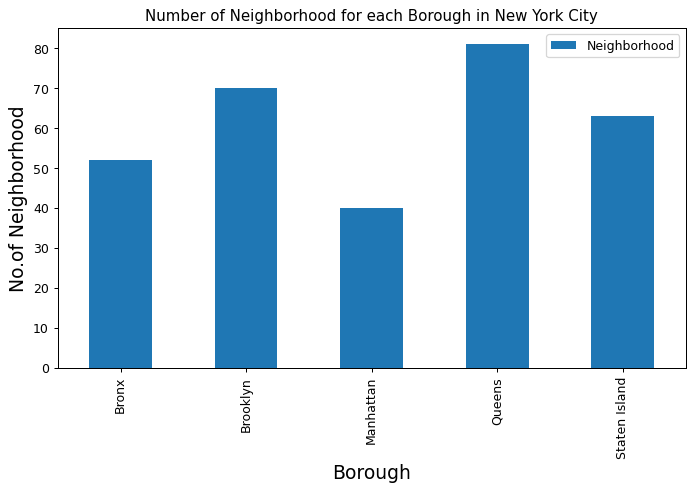

In [13]:
plt.figure(figsize=(9,5), dpi=90)
# title
plt.title('Number of Neighborhood for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize=15)
#On y-axis
plt.ylabel('No.of Neighborhood', fontsize=15)
#giving a bar plot
new_york_data.groupby('Borough')['Neighborhood'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In the above plot, we can see that Queens has highest number of neighborhoods.
Next we will collect brazilian resturants for each Neighborhood.

In [14]:
# prepare neighborhood list that contains brazilian resturants
column_names = ['Borough', 'Neighborhood', 'ID','Name']
brazilian_rest_ny = pd.DataFrame(columns=column_names)
count = 1
for row in new_york_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    brazilian_resturants = venues[venues['Category']=='Brazilian Restaurant']   
    print('(',count,'/',len(new_york_data),')','Brazilian Resturants in '+Neighborhood+', '+Borough+':'+str(len(brazilian_resturants)))
    for resturant_detail in brazilian_resturants.values.tolist():
        id, name , category = resturant_detail
        brazilian_rest_ny = brazilian_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    count+=1

( 1 / 306 ) Brazilian Resturants in Wakefield, Bronx:0
( 2 / 306 ) Brazilian Resturants in Co-op City, Bronx:0
( 3 / 306 ) Brazilian Resturants in Eastchester, Bronx:0
( 4 / 306 ) Brazilian Resturants in Fieldston, Bronx:0
( 5 / 306 ) Brazilian Resturants in Riverdale, Bronx:0
( 6 / 306 ) Brazilian Resturants in Kingsbridge, Bronx:0
( 7 / 306 ) Brazilian Resturants in Marble Hill, Manhattan:0
( 8 / 306 ) Brazilian Resturants in Woodlawn, Bronx:0
( 9 / 306 ) Brazilian Resturants in Norwood, Bronx:0
( 10 / 306 ) Brazilian Resturants in Williamsbridge, Bronx:0
( 11 / 306 ) Brazilian Resturants in Baychester, Bronx:0
( 12 / 306 ) Brazilian Resturants in Pelham Parkway, Bronx:0
( 13 / 306 ) Brazilian Resturants in City Island, Bronx:0
( 14 / 306 ) Brazilian Resturants in Bedford Park, Bronx:0
( 15 / 306 ) Brazilian Resturants in University Heights, Bronx:0
( 16 / 306 ) Brazilian Resturants in Morris Heights, Bronx:0
( 17 / 306 ) Brazilian Resturants in Fordham, Bronx:0
( 18 / 306 ) Brazilia

Now that we have got all the brazilian resturants in new york city , we will analyze it.

In [15]:
brazilian_rest_ny.head()

,Borough,Neighborhood,ID,Name
0,Brooklyn,Bedford Stuyvesant,5b93f64b598e64002c8a81bf,Petisco Brazuca
1,Manhattan,Greenwich Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil
2,Manhattan,West Village,3fd66200f964a52008e71ee3,Casa
3,Manhattan,West Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil
4,Queens,Astoria,4bdf502a89ca76b062b75d5e,Favela Grill


In [16]:
brazilian_rest_ny.shape

(14, 4)

In [17]:
# saving brazilian restaurant data to csv in we need in the future
brazilian_rest_ny.to_csv('brazilian_rest_ny.csv', index=False)

### There are 14 Brazilian Resturants across New York City.
Now let create a bar plot to show Number of Brazilian Resturants for each Borough in New York City.

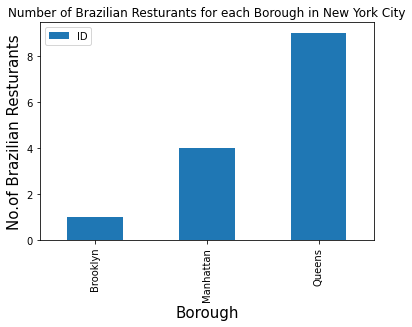

In [18]:
# title
plt.title('Number of Brazilian Resturants for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize=15)
#On y-axis
plt.ylabel('No.of Brazilian Resturants', fontsize=15)
#giving a bar plot
brazilian_rest_ny.groupby('Borough')['ID'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()


Above you can see a bar plot, that Queens has highest number of Brazilian resturants.

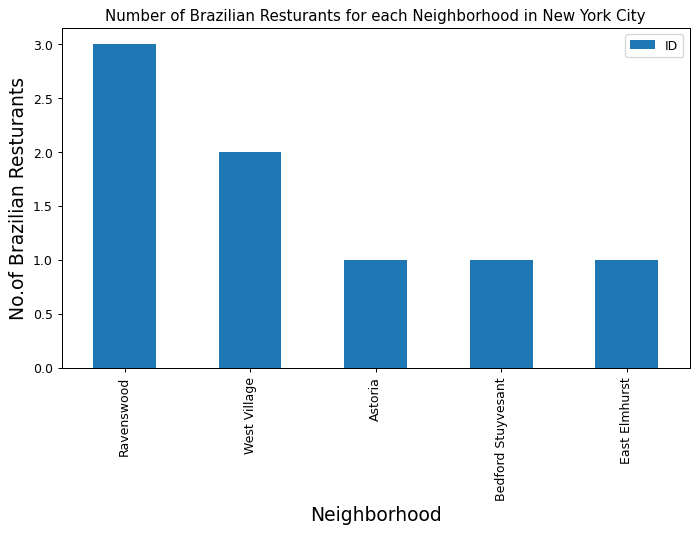

In [19]:
plt.figure(figsize=(9,5), dpi=90)
# title
plt.title('Number of Brazilian Resturants for each Neighborhood in New York City')
#On x-axis
plt.xlabel('Neighborhood', fontsize=15)
#On y-axis
plt.ylabel('No.of Brazilian Resturants', fontsize=15)
#giving a bar plot
brazilian_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(5).plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [20]:
brazilian_rest_ny[brazilian_rest_ny['Neighborhood']=='Ravenswood']

,Borough,Neighborhood,ID,Name
9,Queens,Ravenswood,4b6dbc02f964a520c98a2ce3,New York Pão de Queijo
10,Queens,Ravenswood,4c4f33b824edc9b633ab4ebb,Copacabana Brazilian Restaurant
11,Queens,Ravenswood,5338a897498e1b9bc410d5d1,Beija Flor


We can see that, Ravenswood in Queens has the highest number of Brazilian Resturants with a total count of 03.
Now we will get the ranking of each resturant for further analysis.

In [21]:
# prepare neighborhood list that contains brazilian resturants
column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
brazilian_rest_stats_ny=pd.DataFrame(columns=column_names)

count = 1

for row in brazilian_rest_ny.values.tolist():
    Borough,Neighborhood,ID,Name=row
    try:
        venue_details=get_venue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        # we will assign 0 value for these resturants as they may have been 
        #recently opened or details does not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(brazilian_rest_ny),')','processed')
    brazilian_rest_stats_ny = brazilian_rest_stats_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1

                         ID             Name  Likes  Rating  Tips
0  5b93f64b598e64002c8a81bf  Petisco Brazuca      6     7.1     1
( 1 / 14 ) processed
                         ID                Name  Likes  Rating  Tips
0  4a5b5143f964a520fdba1fe3  Berimbau do Brasil    271     8.9   129
( 2 / 14 ) processed
                         ID  Name  Likes  Rating  Tips
0  3fd66200f964a52008e71ee3  Casa    194     8.7    66
( 3 / 14 ) processed
                         ID                Name  Likes  Rating  Tips
0  4a5b5143f964a520fdba1fe3  Berimbau do Brasil    271     8.9   129
( 4 / 14 ) processed
                         ID          Name  Likes  Rating  Tips
0  4bdf502a89ca76b062b75d5e  Favela Grill     86     8.6    57
( 5 / 14 ) processed
                         ID        Name  Likes  Rating  Tips
0  5338a897498e1b9bc410d5d1  Beija Flor     69     8.7    19
( 6 / 14 ) processed
                         ID                  Name  Likes  Rating  Tips
0  4f0b6fb3e4b07c79f8f42d61  Rainhas 

In [22]:
brazilian_rest_stats_ny.head()

,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
0,Brooklyn,Bedford Stuyvesant,5b93f64b598e64002c8a81bf,Petisco Brazuca,6,7.1,1
1,Manhattan,Greenwich Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil,271,8.9,129
2,Manhattan,West Village,3fd66200f964a52008e71ee3,Casa,194,8.7,66
3,Manhattan,West Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil,271,8.9,129
4,Queens,Astoria,4bdf502a89ca76b062b75d5e,Favela Grill,86,8.6,57


In [23]:
brazilian_rest_stats_ny.shape

(14, 7)

In [24]:
brazilian_rest_stats_ny.shape

(14, 7)

Now that we got data for all resturants Now lets save this data to a csv sheet. In case we by mistake modify it. As the number of calls to get details for venue are premium call and have limit of 500 per day, we will refer to saved data sheet csv if required.

In [25]:
# saving brazilian restaurant data to csv in we need in the future
brazilian_rest_stats_ny.to_csv('brazilian_rest_stats_ny.csv', index=False)

In [26]:
# reading the file save above
brazilian_rest_stats_ny_csv=pd.read_csv('brazilian_rest_stats_ny.csv')

In [27]:
brazilian_rest_stats_ny_csv.shape

(14, 7)

In [28]:
brazilian_rest_stats_ny_csv.head()

,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
0,Brooklyn,Bedford Stuyvesant,5b93f64b598e64002c8a81bf,Petisco Brazuca,6,7.1,1
1,Manhattan,Greenwich Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil,271,8.9,129
2,Manhattan,West Village,3fd66200f964a52008e71ee3,Casa,194,8.7,66
3,Manhattan,West Village,4a5b5143f964a520fdba1fe3,Berimbau do Brasil,271,8.9,129
4,Queens,Astoria,4bdf502a89ca76b062b75d5e,Favela Grill,86,8.6,57


In [29]:
brazilian_rest_stats_ny_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Borough       14 non-null     object 
 1   Neighborhood  14 non-null     object 
 2   ID            14 non-null     object 
 3   Name          14 non-null     object 
 4   Likes         14 non-null     int64  
 5   Rating        14 non-null     float64
 6   Tips          14 non-null     int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 912.0+ bytes


The Data type of 'Likes' and 'Tips' are of type 'int64'. we will convert them into type 'Float' for further analysis.

In [30]:
brazilian_rest_stats_ny['Likes']=brazilian_rest_stats_ny['Likes'].astype('float64')
brazilian_rest_stats_ny['Tips']=brazilian_rest_stats_ny['Tips'].astype('float64')

In [31]:
brazilian_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Borough       14 non-null     object 
 1   Neighborhood  14 non-null     object 
 2   ID            14 non-null     object 
 3   Name          14 non-null     object 
 4   Likes         14 non-null     float64
 5   Rating        14 non-null     float64
 6   Tips          14 non-null     float64
dtypes: float64(3), object(4)
memory usage: 912.0+ bytes


Now we will find the Brazilian restuarants with Maximum Likes, Maximum Ratings and Maximum Tips.

In [32]:
# Resturant with maximum Likes
brazilian_rest_stats_ny.iloc[brazilian_rest_stats_ny['Likes'].idxmax()]

Borough                        Manhattan
Neighborhood             Stuyvesant Town
ID              458d06def964a520ff3f1fe3
Name                           Esperanto
Likes                                342
Rating                               8.4
Tips                                 162
Name: 13, dtype: object

In [33]:
# Resturant with maximum Rating
brazilian_rest_stats_ny.iloc[brazilian_rest_stats_ny['Rating'].idxmax()]

Borough                        Manhattan
Neighborhood           Greenwich Village
ID              4a5b5143f964a520fdba1fe3
Name                  Berimbau do Brasil
Likes                                271
Rating                               8.9
Tips                                 129
Name: 1, dtype: object

In [34]:
# Resturant with maximum Tips
brazilian_rest_stats_ny.iloc[brazilian_rest_stats_ny['Tips'].idxmax()]

Borough                        Manhattan
Neighborhood             Stuyvesant Town
ID              458d06def964a520ff3f1fe3
Name                           Esperanto
Likes                                342
Rating                               8.4
Tips                                 162
Name: 13, dtype: object


Next lets visualize neighborhood with maximum average rating of resturants.

In [35]:
ny_neighborhood_stats=brazilian_rest_stats_ny.groupby('Neighborhood', as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats.columns=['Neighborhood','Average Rating']

In [36]:
ny_neighborhood_stats.sort_values(['Average Rating'],ascending=False).head(15)

,Neighborhood,Average Rating
3,Greenwich Village,8.9
10,West Village,8.8
4,Long Island City,8.7
0,Astoria,8.6
6,Ravenswood,8.6
9,Stuyvesant Town,8.4
8,Steinway,7.7
1,Bedford Stuyvesant,7.1
2,East Elmhurst,6.8
5,North Corona,6.8


### The top neighborhoods with top average rating of brazilian resturants.
Similarly we will find the average rating of Brazilian Resturants for each Borough.

In [37]:
ny_borough_stats=brazilian_rest_stats_ny.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
ny_borough_stats.columns=['Borough','Average Rating']

In [38]:
ny_borough_stats.sort_values(['Average Rating'],ascending=False).head()

,Borough,Average Rating
1,Manhattan,8.725000
2,Queens,7.844444
0,Brooklyn,7.100000



Lets Visualize it.

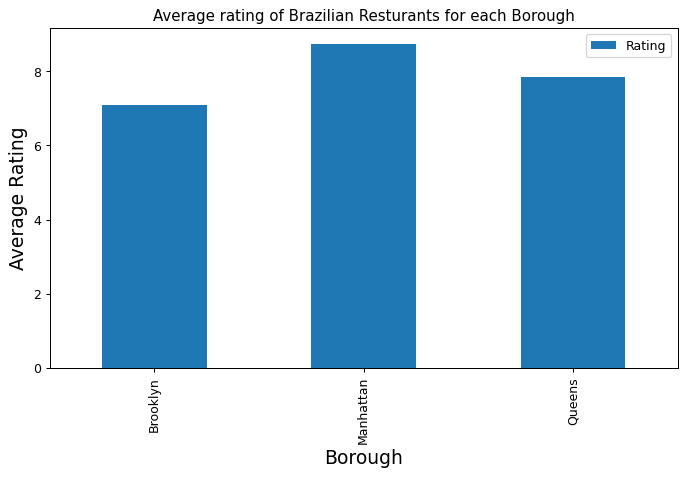

In [39]:
plt.figure(figsize=(9,5), dpi=90)
# title
plt.title('Average rating of Brazilian Resturants for each Borough')
#On x-axis
plt.xlabel('Borough', fontsize=15)
#On y-axis
plt.ylabel('Average Rating', fontsize=15)
#giving a bar plot
brazilian_rest_stats_ny.groupby('Borough').mean()['Rating'].plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

We will consider all the neighborhoods with average rating greater or equal 7.0 to visualize on map.

In [40]:
ny_neighborhood_stats = ny_neighborhood_stats[ny_neighborhood_stats['Average Rating']>=7.0]

In [41]:
ny_neighborhood_stats

,Neighborhood,Average Rating
0,Astoria,8.6
1,Bedford Stuyvesant,7.1
3,Greenwich Village,8.9
4,Long Island City,8.7
6,Ravenswood,8.6
8,Steinway,7.7
9,Stuyvesant Town,8.4
10,West Village,8.8


We will join this dataset to original new york data to get lonitude and latitude.

In [42]:
ny_neighborhood_stats = pd.merge(ny_neighborhood_stats,new_york_data, on='Neighborhood')

In [43]:
ny_neighborhood_stats = ny_neighborhood_stats[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]


In [44]:
ny_neighborhood_stats

,Borough,Neighborhood,Latitude,Longitude,Average Rating
0,Queens,Astoria,40.768509,-73.915654,8.6
1,Brooklyn,Bedford Stuyvesant,40.687232,-73.941785,7.1
2,Manhattan,Greenwich Village,40.726933,-73.999914,8.9
3,Queens,Long Island City,40.750217,-73.939202,8.7
4,Queens,Ravenswood,40.761705,-73.931575,8.6
5,Queens,Steinway,40.775923,-73.902290,7.7
6,Manhattan,Stuyvesant Town,40.731000,-73.974052,8.4
7,Manhattan,West Village,40.734434,-74.006180,8.8


Finally, Let's show this data on a map.

In [45]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)

In [46]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the neighborhood and add each to the feature group
for lat, lng, in ny_neighborhood_stats[['Latitude','Longitude']].values:
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

Lets add a new field to dataframe for labeling purpose.



In [47]:
ny_neighborhood_stats['Label']=ny_neighborhood_stats['Neighborhood']+', '+ny_neighborhood_stats['Borough']+'('+ny_neighborhood_stats['Average Rating'].map(str)+')'

In [48]:
# add pop-up text to each marker on the map
for lat, lng, label in ny_neighborhood_stats[['Latitude','Longitude','Label']].values:
    folium.Marker([lat, lng], popup=label).add_to(ny_map)        
# add incidents to map
ny_map.add_child(incidents)

Now that we have visualized the Neighborhoods. Lets Visualize Boroughs based on average Rating.



In [50]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)
ny_geo = r'Borough_Boundaries.geojson'
folium.Choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Rating',
    highlight=True
).add_to(ny_map)
ny_map

Parks properties near to places can help with feature decision

In [51]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)
ny_geo = r'Parks_Properties.geojson'
folium.Choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Parks Properties',
    highlight=True
).add_to(ny_map)
ny_map

## 4. Modeling

In this part of the project, it was not necessary to include machine learning models, as the result was enough for the stakeholders to make the right decision on where to open the new Brazilian restaurant.

## 5. Evaluation

I have answered all posed business questions in the introduction of this project. Now it is up to the stakeholders to decide whether the new restaurant will open, only with the analysis of this data set, otherwise more data will be needed so that even a machine learning model is implemented.

## 6. Deployment

In this project, we are going to implement this feature in the future using simple linear regression algorithm with scikit-learn for simplicity, we will use Flask as it is a very light web framework.

## 7. Conclusions

In this study, I analyzed the relationship between the neighborhoods of New York City to find insights. So now, we can answer the questions asked above in the Business Understand section of the notebook.
For our analysis the answers to the above questions are:

- Greenwich Villag (Manhattan), West Village (Manhattan), Astoria (Queens) are some of the best neighborhoods for Brazilian Cuisine.

- Manhattan have potential to Brazilian Restaurant Market.

- Bedford Stuyvesant ranks last in average rating of Brazilian Restaurants.

- Manhattan is the best place to stay if you prefer Brazilian Cuisine.
